In [335]:
import os
import warnings
warnings.filterwarnings("ignore")

import pygmt
import numpy as np
import pandas as pd 
import xarray as xr

from scipy.optimize import curve_fit
from scipy.interpolate import make_interp_spline
from scipy.stats import pearsonr
from scipy.stats import spearmanr

%config InlineBackend.figure_formats = ['svg']

import matplotlib.pyplot as plt
%matplotlib inline

# Basin flux from paleo-physiography dataset

### Dataset link

Salles, T., L. Husson, M. Lorcery, B. Halder Boggiani (2022). Paleo-Physiography Elevation-only Dataset, HydroShare, http://www.hydroshare.org/resource/b3f1e3581d174bf58b00ba5672604710

### THREDDS Data Service

https://thredds.hydroshare.org/thredds/catalog/hydroshare/resources/b3f1e3581d174bf58b00ba5672604710/data/contents/catalog.html

For this notebook, the dataset on Hydroshare has been downloaded locally.

In [302]:
hydroshare = 'outputs/nphysio/physio'

Load the simulation times:

In [303]:
bristol_model = pd.read_csv('dataset/bristol_sim_list.csv')
bristol_model

,model,time,name
0,texqe,541,541Ma
1,texqd,535,535Ma
2,texqc,530,530Ma
3,texqb,525,525Ma
4,texqa,520,520Ma
...,...,...,...
104,texpe,20,20Ma
105,texpd,15,15Ma
106,texpc,11,11Ma
107,texpb,3,3Ma


### Paleo-flux Phanerozoic flux

Paleo-flux Phanerozoic per basins available from Hydroshare needs to be downloaded to perform the analysis below.

#### Reference
Salles, T., L. Husson, M. Lorcery, B. Halder Boggiani (2022). Paleo-flux Phanerozoic per basins (sediment and water), HydroShare, http://www.hydroshare.org/resource/547dda8a59b345eeb62c24b2cf6511bb


There are 2 csv files per time step (one for the water discharge and one for the sediment flux). 

The **flow** dataset contains 5 columns:

+ the first one is the basin index,
+ the second and third ones are the position of the outlet (longitude and latitude respectively),
+ the fourth column is the basin area in (km$^2$)
+ the last column is the corresponding discharge value (km$^3$/yr).


The **sed** dataset contains 4 columns:

+ the first one is the basin index,
+ the second and third ones are the position of the outlet (longitude and latitude respectively),
+ the last column is the corresponding sediment flux value (km$^3$/yr).

In [323]:
# Pick a time in Ma (needs to be a integer)
step = 52

# Get the fluxes files downloaded from Hydroshare
seddf = pd.read_csv('outputs/wsflux/sed'+str(step)+'.csv')
flowdf = pd.read_csv('outputs/wsflux/flow'+str(step)+'.csv')

We will convert from km$^3$/yr to m$^3$/yr and will use the log values for plotting:

In [324]:
logFA = np.log10(flowdf['val'].values*1.e9)
logSed = np.log10(seddf['val'].values*1.e9)

We now sort the flux by ascending values:

In [325]:
sorted_index_array = np.argsort(logFA)
sortedFA = logFA[sorted_index_array]
sortedLon = flowdf['lon'].values[sorted_index_array]
sortedLat = flowdf['lat'].values[sorted_index_array]

sorted_index_array1 = np.argsort(logSed)
sortedSed = logSed[sorted_index_array1]
sortedLon1 = seddf['lon'].values[sorted_index_array1]
sortedLat1 = seddf['lat'].values[sorted_index_array1]

For these first plots we will only plot the largest flux (specified by the `nlargest` value)

In [326]:
# Define nth values
nlargest = 500

# Water flux largest values
rLon = sortedLon[-nlargest : ]
rLat = sortedLat[-nlargest : ]
rFA = sortedFA[-nlargest : ]

# Sediment flux largest values
rLon1 = sortedLon1[-nlargest : ]
rLat1 = sortedLat1[-nlargest : ]
rSed = sortedSed[-nlargest : ]

## Global maps

We will now plot the dataset on a global map.

First the start with the water flux:

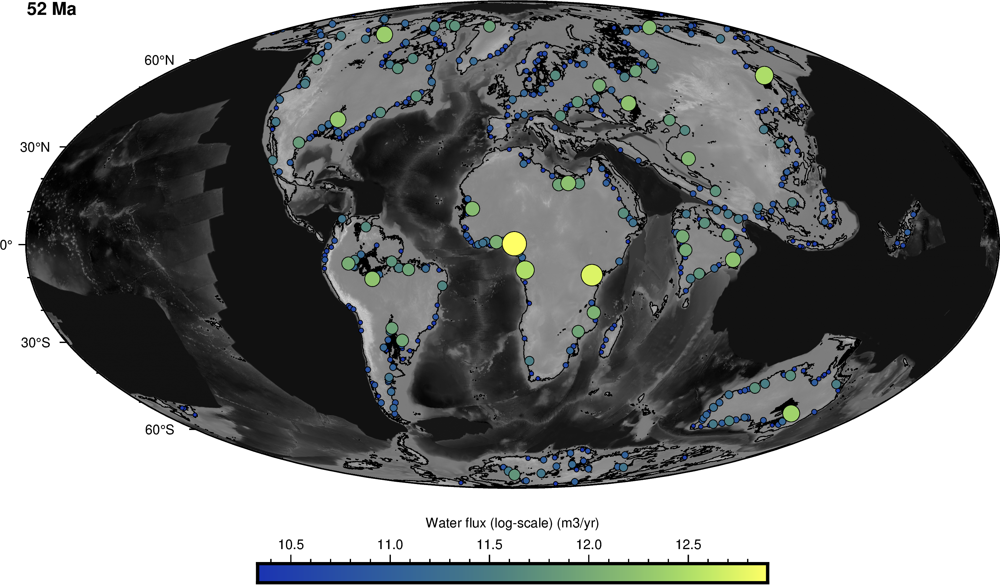

In [333]:
dataset = xr.open_dataset('outputs/nphysio/physio'+str(step)+'Ma.nc')

fig = pygmt.Figure()

# Background image
with pygmt.config(FONT='6p,Helvetica,black'):
    pygmt.makecpt(cmap="gray", series=[-6000, 6000])
    fig.basemap(region='d', projection='W6i', frame='afg')
    fig.grdimage(dataset.z, shading='+a345+nt1+m0', frame=False)
    
    fig.grdcontour(
        interval=0.1,
        grid=dataset.zpaleo,
        limit=[-0.1, 0.1],
    )

# Scatter plot
with pygmt.config(FONT='6p,Helvetica,black'):
    pygmt.makecpt(cmap="imola", series=[rFA.min(), rFA.max()], reverse=False)

    fig.plot(
        x=rLon,
        y=rLat,
        style="cc",
        pen="black",
        size=0.00005 * 2 ** rFA,
        color=rFA,
        cmap=True,
    )

    fig.colorbar(position="jBC+o0c/-1.5c+w8c/0.3c+h", 
                 frame='af+l"Water flux (log-scale) (m3/yr)"')

# Time interval
fig.text(text=str(step)+" Ma", position="TL", font="8p,Helvetica-Bold,black")

fig.show(dpi=500, width=1000)
# fname = 'flow'+str(step)+'Ma.png'
# fig.savefig(fname=fname,dpi=500)

Then the sediment flux:

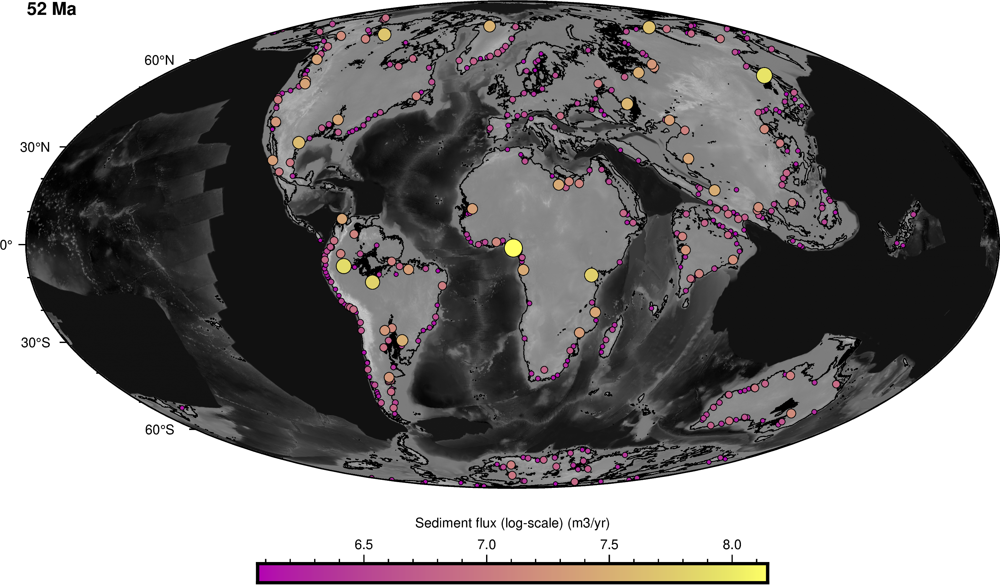

In [334]:
fig = pygmt.Figure()

# Background image
with pygmt.config(FONT='6p,Helvetica,black'):
    pygmt.makecpt(cmap="gray", series=[-6000, 6000])
    fig.basemap(region='d', projection='W6i', frame='afg')
    fig.grdimage(dataset.z, shading='+a345+nt1+m0', frame=False)
    
    fig.grdcontour(
        interval=0.1,
        grid=dataset.zpaleo,
        limit=[-0.1, 0.1],
    )

# Scatter plot
with pygmt.config(FONT='6p,Helvetica,black'):
    pygmt.makecpt(cmap="buda", series=[rSed.min(), rSed.max()])
    fig.plot(
        x=rLon1,
        y=rLat1,
        style="cc",
        pen="black",
        size=0.001 * 2 ** rSed,
        color=rSed,
        cmap=True,
    )
    fig.colorbar(position="jBC+o0c/-1.5c+w8c/0.3c+h", 
                 frame='af+l"Sediment flux (log-scale) (m3/yr)"')

# Time interval
fig.text(text=str(step)+" Ma", position="TL", font="8p,Helvetica-Bold,black")

fig.show(dpi=500, width=1000)
# fname = 'sed'+str(step)+'Ma.png'
# fig.savefig(fname=fname,dpi=500)

## Log-log plots

For any given time interval, we can evaluate the distribution of flux against basin area.

In [336]:
def power_law(x, a, b):
    return a*np.power(x, b)


def powerFitting(area, data):
    
    # Fit the dummy power-law data
    pars, cov = curve_fit(f=power_law, xdata=area, ydata=data, p0=[0, 0], bounds=(-np.inf, np.inf))
    # Get the standard deviations of the parameters (square roots of the # diagonal of the covariance)
    stdevs = np.sqrt(np.diag(cov))
    # Calculate the residuals
    res = data - power_law(area, *pars)

    ss_res = np.sum(res**2)
    ss_tot = np.sum((data-np.mean(data))**2)
    r_squared = 1 - (ss_res / ss_tot)
    fitlaw = power_law(area, *pars)
    
    return r_squared, fitlaw

fitflow = powerFitting(flowdf['area'], flowdf['val'])
fitsed = powerFitting(flowdf['area'], seddf['val'])

Let's plot the corresponding log-log distribution

In [343]:
f, (a0, a1) = plt.subplots(1, 2, gridspec_kw={'width_ratios': [1, 1]}, figsize=(10, 4), dpi=300)

a0.scatter(flowdf['area'], flowdf['val'], color='tab:blue', 
            edgecolors= 'k', s=50, linewidths=1, alpha=0.25,zorder=3)
a0.set_xscale('log')
a0.set_yscale('log')
a0.plot(flowdf['area'], fitflow[1],c='k',ls='-',lw=3,alpha=0.5,zorder=2)
a0.set_xlim([1e3,2e7])
a0.set_ylim([1,10000])
a0.set_xlabel('Basin Drainage Area km$^2$')
a0.set_ylabel('Water Discharge km$^3$/yr')
a0.tick_params(axis='both', labelsize=8)

a1.set_xscale('log')
a1.set_yscale('log')
a1.set_xlim([1e3,2e7])
a1.set_ylim([1e-4,0.2])
a1.scatter(flowdf['area'], seddf['val'], color='tab:orange', 
           edgecolors= 'k', s=50, linewidths=1, alpha=0.25,zorder=3)
a1.plot(flowdf['area'], fitsed[1],c='k',ls='-',lw=3,alpha=0.5,zorder=2)
a1.set_xlabel('Basin Drainage Area km$^2$')
a1.set_ylabel('Sediment Discharge km$^3$/yr')
a1.tick_params(axis='both', labelsize=8)
a1.yaxis.set_label_position("right")
a1.yaxis.tick_right()

a0.text(3.e6, 2, 'r$^2$ %.2f'% fitflow[0], style='italic')
a1.text(3.e6, 2.e-4, 'r$^2$ %.2f'% fitsed[0], style='italic')

f.tight_layout(pad=0.1)
# plt.savefig('logplot'+str(step)+'Ma.pdf')
plt.show()

## Temporal evaluation

We will now explore the evolution through time to do so we will extract the following parameters:

+ the average basin area flux `area_mean`, `area_mean_top` (total and for the `nlargest` rivers) 
+ the average water flux `wflx_mean`, `wflx_mean_top` (total and for the `nlargest` rivers) 
+ the average sediment flux `sflx_mean`, `sflx_mean_top` (total and for the `nlargest` rivers) 
+ the total sediment flux `sflx_tot`, `sflx_tot_top` (total and for the `nlargest` rivers) 

In [391]:
# Pick a time in Ma needs to be a integer
maxnb = 1000

sflx_tot = []
area_mean = []
wflx_mean = []
sflx_mean = []
sflx_tot_top = []
area_mean_top = []
wflx_mean_top = [] 
sflx_mean_top = []

def topFlux(sed, flow, top):
    
    sedsort = sed.sort_values(by='val',ascending=False).head(top)
    flowsort = flow.sort_values(by='val',ascending=False).head(top)
    
    return np.log10(sedsort.val*1e9).sum(), np.log10(sedsort.val*1e9).mean(), np.log10(flowsort.val*1e9).mean(), flowsort.area.mean()

def smoothCurve(time, data, nbfine=542):
    
    ftime = np.linspace(time.min(), time.max(), nbfine)
    
    interp = make_interp_spline(time, np.asarray(data), k=3)
    
    return -ftime,interp(ftime)

In [387]:
for k in range(len(bristol_model)):
    
    step = bristol_model.time.iloc[k]
    
    seddf = pd.read_csv('outputs/wsflux/sed'+str(step)+'.csv')
    flowdf = pd.read_csv('outputs/wsflux/flow'+str(step)+'.csv')
    
    sflx_tot.append(np.log10(seddf.val*1e9).sum())
    sflx_mean.append(np.log10(seddf.val*1e9).mean())
    wflx_mean.append(np.log10(flowdf.val*1e9).mean())
    area_mean.append(flowdf.area.mean())
    
    topflx = topFlux(seddf, flowdf, maxnb)
    sflx_tot_top.append(topflx[0])
    sflx_mean_top.append(topflx[1])
    wflx_mean_top.append(topflx[2])
    area_mean_top.append(topflx[3])

Save these global flux in a csv file:

In [388]:
data = {
        "time": -bristol_model.time.values,
        "sflx_tot": sflx_tot,
        "wflx_mean": wflx_mean,
        "sflx_mean": sflx_mean,
        "area_mean": area_mean,
        "sflx_tot_top": sflx_tot_top,
        "wflx_mean_top": wflx_mean_top,
        "sflx_mean_top": sflx_mean_top,
        "area_mean_top": area_mean_top,
        }
df = pd.DataFrame(data)
df.to_csv("globalFlux.csv", index=False)
df

,time,sflx_tot,wflx_mean,sflx_mean,area_mean,sflx_tot_top,wflx_mean_top,sflx_mean_top,area_mean_top
0,-541,25415.456551,8.644561,4.056737,14911.572825,5602.884181,10.220818,5.602884,85512.118617
1,-535,22703.330989,8.569885,3.952530,15905.558628,5533.177463,10.184853,5.533177,85294.134045
2,-530,20465.536543,8.858954,3.982397,16956.101778,5514.156902,10.166805,5.514157,82006.334435
3,-525,20874.081617,8.724203,3.944460,15619.236597,5533.426169,10.225052,5.533426,77213.574592
4,-520,22576.292010,8.684561,3.989449,13998.130975,5603.127066,10.267430,5.603127,72477.071772
...,...,...,...,...,...,...,...,...,...
104,-20,74803.890276,8.350751,4.058811,8380.631866,6096.086497,10.418548,6.096086,135965.956589
105,-15,72227.966216,8.316918,3.994689,8604.662209,6040.267194,10.380825,6.040267,136157.571797
106,-11,75646.600428,8.329931,3.972827,8072.244569,6056.804638,10.357381,6.056805,137425.062708
107,-3,72414.407276,8.326665,3.911755,7971.662532,6044.553558,10.355312,6.044554,130552.621957


We will now make several plots to evaluate these parameters.

In [415]:
Sflx = smoothCurve(df.time, df['sflx_mean'])
topSflx = smoothCurve(df.time, df['sflx_mean_top'])

Wflx = smoothCurve(df.time, df['wflx_mean'])
topWflx = smoothCurve(df.time, df['wflx_mean_top'])

bA = smoothCurve(df.time, df['area_mean'])
topbA = smoothCurve(df.time, df['area_mean_top'])

Sflxt = smoothCurve(df.time, df['sflx_tot'])
topSflxt = smoothCurve(df.time, df['sflx_tot_top'])

Let's do our plot:

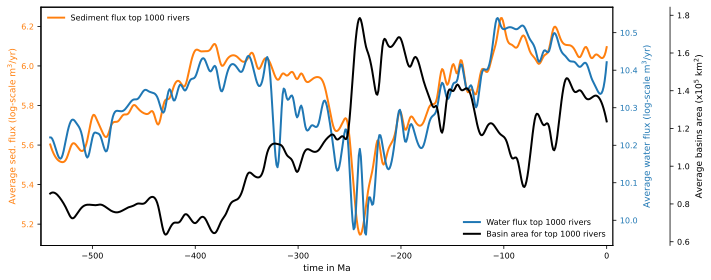

In [414]:
fig, ax1 = plt.subplots(figsize=(10, 4), dpi=300)

ax1.plot(-topSflx[0], topSflx[1], '-', color='tab:orange', zorder=4, lw=2, label='Sediment flux top '+str(maxnb)+' rivers')
plt.xticks(fontsize=8)
plt.yticks(fontsize=8)
plt.xlim([-550,6])
ax1.tick_params(axis='y', labelcolor='tab:orange')
plt.xlabel('time in Ma', fontsize=9)
plt.ylabel('Average sed. flux (log-scale m$^3$/yr)', fontsize=9, color='tab:orange')
plt.legend(frameon=False, prop={'size': 8}, loc=2)

ax2 = ax1.twinx()
ax2.set_ylabel('Average water flux (log-scale m$^3$/yr)', color='tab:blue', fontsize=9)
lns1 = ax2.plot(-topWflx[0], topWflx[1], color='tab:blue', zorder=3, lw=2, label='Water flux top '+str(maxnb)+' rivers')
ax2.tick_params(axis='y', labelcolor='tab:blue')
plt.xticks(fontsize=8)
plt.yticks(fontsize=8)

twin2 = ax1.twinx()
twin2.spines.right.set_position(("axes", 1.1))
lns2 = twin2.plot(-topbA[0], topbA[1]/1.e5, '-', color='k', zorder=2, lw=2, label='Basin area for top '+str(maxnb)+' rivers')
twin2.tick_params(axis='y', labelcolor='k')
twin2.set_ylabel('Average basins area (x10$^5$ km$^2$)', fontsize=9, color='k')

lns = lns1+lns2
labs = [l.get_label() for l in lns]
plt.legend(lns, labs, frameon=False, prop={'size': 8}, loc=4)

plt.xticks(fontsize=8)
plt.yticks(fontsize=8)
fig.tight_layout()
# plt.savefig('swflux_top.pdf')
plt.show()

Temporal evolution of the sediment flux for all rivers and largest ones (note the difference in scale):

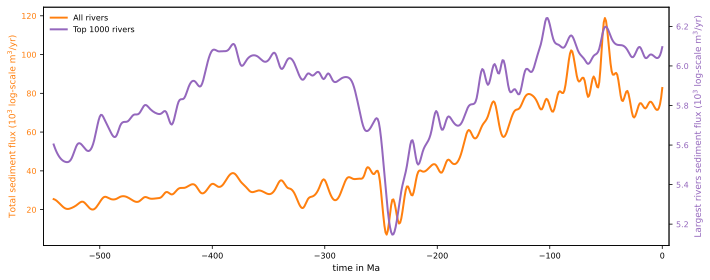

In [423]:
fig, ax1 = plt.subplots(figsize=(10, 4), dpi=300)

lns1 = ax1.plot(-Sflxt[0], Sflxt[1]/1.e3, '-', color='tab:orange', zorder=2, lw=2, label='All rivers')
plt.xticks(fontsize=8)
plt.yticks(fontsize=8)
plt.xlim([-550,6])
ax1.tick_params(axis='y', labelcolor='tab:orange')
plt.xlabel('time in Ma', fontsize=9)
plt.ylabel('Total sediment flux (10$^3$ log-scale m$^3$/yr)', fontsize=9, color='tab:orange')

ax2 = ax1.twinx()
ax2.set_ylabel('Largest rivers sediment flux (10$^3$ log-scale m$^3$/yr)', color='tab:purple', fontsize=9)
lns2 = ax2.plot(-topSflxt[0], topSflxt[1]/1.e3, color='tab:purple', lw=2, label='Top '+str(maxnb)+' rivers')
ax2.tick_params(axis='y', labelcolor='tab:purple')
plt.xticks(fontsize=8)
plt.yticks(fontsize=8)

lns = lns1+lns2
labs = [l.get_label() for l in lns]
plt.legend(lns, labs, frameon=False, prop={'size': 8}, loc=2)

plt.xticks(fontsize=8)
plt.yticks(fontsize=8)
fig.tight_layout()
# plt.savefig('sflux_sum.pdf')
plt.show()

Evaluation of largest rivers contribution to the total sediment flux distributed to the ocean:

In [464]:
maxnb2 = 50

ratio_sflx = []

for k in range(len(bristol_model)):
    
    step = bristol_model.time.iloc[k]
    
    seddf = pd.read_csv('outputs/wsflux/sed'+str(step)+'.csv')
    sum_sflx = np.sum(seddf.val)
    
    sedsort = seddf.sort_values(by='val',ascending=False).head(maxnb2)
    sum_sflx_top = np.sum(sedsort.val)
    
    ratio_sflx.append(sum_sflx_top/sum_sflx)
    
ratio = smoothCurve(df.time, ratio_sflx)

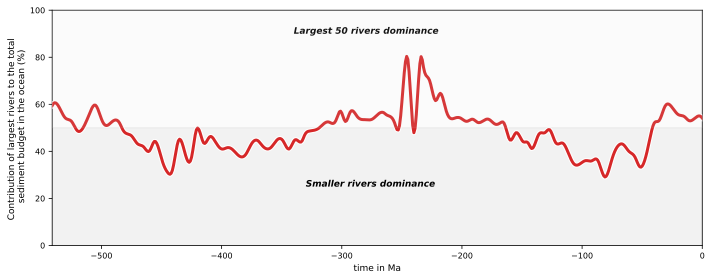

In [472]:
fig, ax1 = plt.subplots(figsize=(10, 4), dpi=300)
ax1.plot(-ratio[0], ratio[1]*100, '-', color='tab:red', zorder=6, lw=3)
ax1.plot(-ratio[0], ratio[1]*100, '-', color='w', zorder=4, lw=5)
plt.xticks(fontsize=8)
plt.yticks(fontsize=8)
plt.xlim([-541,0])
plt.ylim([0,100])
plt.xlabel('time in Ma', fontsize=9)
plt.ylabel('Contribution of largest rivers to the total \n sediment budget in the ocean (%)', fontsize=9, color='k')

ax1.fill_between(-ratio[0], 50, color='tab:grey', zorder=2, alpha=0.1)
ax1.fill_between(-ratio[0], 50, 100, color='lightgray', zorder=6, alpha=0.1)

ax1.text(-340, 90, 'Largest '+str(maxnb2)+' rivers dominance', style='italic', fontsize=9, weight='bold')
ax1.text(-330, 25, 'Smaller rivers dominance', style='italic', fontsize=9, weight='bold')

fig.tight_layout()
plt.show()